In [1]:
import matplotlib.pyplot as plt
from astropy.io import fits
import pandas as pd, numpy as np, os, keras
from numpy import asarray
from PIL import Image
from keras.preprocessing.image import load_img

#clear keras backend
keras.backend.clear_session()

In [36]:
from numpy import asarray
from PIL import Image
# load image
image = Image.open('bondi_beach.jpg')
pixels = asarray(image)
# confirm pixel range is 0-255
print('Data Type: %s' % pixels.dtype)
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))
# convert from integers to floats
pixels = pixels.astype('float32')
# normalize to the range 0-1
pixels /= 255.0
# confirm the normalization
print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))


Data Type: uint8
Min: 0.000, Max: 255.000
Min: 0.000, Max: 1.000


In [38]:
image = Image.open('bw.jpg')
pixels = asarray(image)
pixels = pixels.astype('float32')
pixels /= 255.0
print(pixels.shape)

print('Min: %.3f, Max: %.3f' % (pixels.min(), pixels.max()))

(545, 970, 3)
Min: 0.000, Max: 0.980


In [ ]:
# fit a cnn on the fashion mnist dataset
from keras.datasets import fashion_mnist
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Dense
from keras.layers import Flatten
# load dataset
(trainX, trainY), (testX, testY) = fashion_mnist.load_data()
# reshape dataset to have a single channel
trainX = trainX.reshape((trainX.shape[0], 28, 28, 1))
testX = testX.reshape((testX.shape[0], 28, 28, 1))
# convert from integers to floats
trainX, testX = trainX.astype('float32'), testX.astype('float32')
# normalize to range 0-1
trainX,testX  = trainX / 255.0, testX / 255.0

# one hot encode target values
trainY, testY = to_categorical(trainY), to_categorical(testY)      #only need this if using labels

# model I found on the internet

model = Sequential()
model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', input_shape=(28, 28, 1)))
model.add(MaxPooling2D())
model.add(Flatten())
model.add(Dense(100, activation='relu', kernel_initializer='he_uniform'))
model.add(Dense(10, activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
# fit model
model.fit(trainX, trainY, epochs=10, batch_size=32, verbose=2)
# evaluate model
loss, acc = model.evaluate(testX, testY, verbose=0)
print(loss, acc)

print(model.summary())

In [119]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Dense, Flatten, Reshape, Dropout, InputLayer

def autoencoder_two(img_size):
    stacked_encoder = keras.models.Sequential([
        keras.layers.Flatten(input_shape=[img_size[0], img_size[1],1]),
        keras.layers.Dense(200, activation="selu"),
        keras.layers.Dense(100, activation="selu"),
        keras.layers.Dense(30, activation="selu"),])

    stacked_decoder = keras.models.Sequential([
        keras.layers.Dense(100, activation="selu", input_shape=[30]),
        keras.layers.Dense(200, activation="selu", input_shape=[100]),
        keras.layers.Dense(img_size[0] * img_size[1], activation="sigmoid"),
        keras.layers.Reshape([img_size[0], img_size[1],1])])
    
    return stacked_encoder, stacked_decoder

In [103]:
def autoencoder_three(img_size):
    encoder = Sequential([
        InputLayer(input_shape=[img_size[0], img_size[1],1]),
        keras.layers.Flatten(input_shape=[img_size[0], img_size[1],1]),
        keras.layers.Conv2D(filters=64, kernel_size=7, activation='relu', padding='same'),
        keras.layers.MaxPooling2D(pool_size=2), 
        Dropout(0.25), 
        keras.layers.Conv2D(128, 3, activation='relu', padding='same'),
        keras.layers.MaxPooling2D(pool_size=2),
        Dropout(0.25),
        keras.layers.Conv2D(256, 3, activation='relu', padding='same'),
        keras.layers.MaxPooling2D(pool_size=2),
        Dropout(0.4)
    ])
    
    decoder = Sequential([
        Conv2D(256, 3, activation='relu', padding='same'),
        UpSampling2D(2),
        Dropout(0.3),
        Conv2D(128, 3, activation='relu', padding='same'),
        Dropout(0.3),
        Conv2D(64, 3, activation='relu', padding='same'),
        UpSampling2D(2),
        Dropout(0.3),
        Conv2D(1, 3, activation='sigmoid', padding='same')
        #,Reshape([img_size[0], img_size[1],1])
    ])

    return encoder, decoder

In [162]:
trainX.shape

(60000, 28, 28, 1, 1)

In [166]:
encoder, decoder = build_autoencoder([28,28]) 
autoencoder = Sequential([encoder, decoder])
autoencoder.compile(loss="mean_squared_error", optimizer="RMSprop", metrics=['accuracy'])
                    
                    #loss="binary_crossentropy", optimizer=keras.optimizers.SGD(lr=1.2), metrics=['accuracy'])

[28, 28]


In [167]:

#train
epochs= 10
autoencoder_train = autoencoder.fit(trainX, trainX, epochs=epochs,verbose=1,
    validation_data=(trainX, trainX))

# Model evaluation
scores = autoencoder.evaluate(trainX, trainX, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

#save weights & model
# autoencoder = autoencoder.save_weights('autoencoder_weights.h5')
# autoencoder.save("autoencoder.h5py")

accuracy = autoencoder_train.history['accuracy']
val_accuracy = autoencoder_train.history['val_accuracy']
loss = autoencoder_train.history['loss']
val_loss = autoencoder_train.history['val_loss']
epochs = range(len(accuracy))
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,6))
ax1.plot(epochs, accuracy, 'bo', label='Training accuracy')
ax1.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.legend()
ax2.plot(epochs, loss, 'bo', label='Training loss')
ax2.plot(epochs, val_loss, 'b', label='Validation loss')
ax2.set_title('Training and validation loss')
ax2.legend()
plt.show()

Epoch 1/10


ValueError: in user code:

    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:806 train_function  *
        return step_function(self, iterator)
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:796 step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/distribute/distribute_lib.py:1211 run
        return self._extended.call_for_each_replica(fn, args=args, kwargs=kwargs)
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/distribute/distribute_lib.py:2585 call_for_each_replica
        return self._call_for_each_replica(fn, args, kwargs)
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/distribute/distribute_lib.py:2945 _call_for_each_replica
        return fn(*args, **kwargs)
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:789 run_step  **
        outputs = model.train_step(data)
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/keras/engine/training.py:748 train_step
        loss = self.compiled_loss(
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/keras/engine/compile_utils.py:204 __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/keras/losses.py:149 __call__
        losses = ag_call(y_true, y_pred)
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/keras/losses.py:253 call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/util/dispatch.py:201 wrapper
        return target(*args, **kwargs)
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/keras/losses.py:1195 mean_squared_error
        return K.mean(math_ops.squared_difference(y_pred, y_true), axis=-1)
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/ops/gen_math_ops.py:10398 squared_difference
        _, _, _op, _outputs = _op_def_library._apply_op_helper(
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/framework/op_def_library.py:742 _apply_op_helper
        op = g._create_op_internal(op_type_name, inputs, dtypes=None,
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/framework/func_graph.py:591 _create_op_internal
        return super(FuncGraph, self)._create_op_internal(  # pylint: disable=protected-access
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/framework/ops.py:3477 _create_op_internal
        ret = Operation(
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/framework/ops.py:1974 __init__
        self._c_op = _create_c_op(self._graph, node_def, inputs,
    /Library/Frameworks/Python.framework/Versions/3.8/lib/python3.8/site-packages/tensorflow/python/framework/ops.py:1815 _create_c_op
        raise ValueError(str(e))

    ValueError: Dimensions must be equal, but are 24 and 28 for '{{node mean_squared_error/SquaredDifference}} = SquaredDifference[T=DT_FLOAT](sequential_106/sequential_105/conv2d_271/Sigmoid, mean_squared_error/remove_squeezable_dimensions/Squeeze)' with input shapes: [32,24,24,1], [32,28,28,1].


Test Images


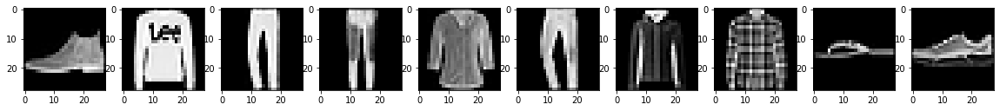

Reconstruction of Test Images


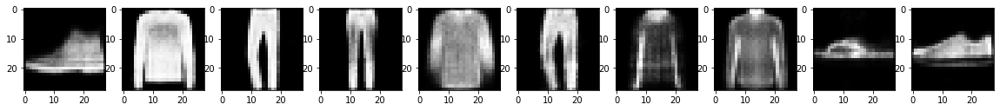

In [32]:
#visually inspect reconstructions to test accuracy
pred = autoencoder.predict(testX)
plt.figure(figsize=(20, 4))
print("Test Images")
for i in range(10):
    plt.subplot(2, 10, i+1)
    plt.imshow(testX[i, ..., 0], cmap='gray')
    curr_lbl = testX[i]
    #plt.title("(Label: " + str(label_dict[curr_lbl]) + ")")
plt.show()    
plt.figure(figsize=(20, 4))
print("Reconstruction of Test Images")
for i in range(10):
    plt.subplot(2, 10, i+1)
    plt.imshow(pred[i, ..., 0], cmap='gray')  
plt.show()

In [3]:
#get spectra in desired redshift range
redshifts = [1.1, 1.2]

#Open the catalog of ~750k QSOs
hdul = fits.open("DR16Q_v4.fits")

data = hdul[1].data

#Pick out some columns that might be useful
#Need to convert data from big- to little-endian for pandas

d = {
    "names" : data['SDSS_NAME'].byteswap().newbyteorder(),
    "plate" : data['PLATE'].byteswap().newbyteorder(),
    "mjd"   : data['MJD'].byteswap().newbyteorder(),
    "fiber" : data['FIBERID'].byteswap().newbyteorder(),
    "z"     : data['Z'].byteswap().newbyteorder(),             #best identified redshift 
    "z_vi"  : data['Z_VI'].byteswap().newbyteorder(),          #redshift from visual inspection
    "z_src" : data['SOURCE_Z'].byteswap().newbyteorder(),      #source of best-redshift determination
    "S2N"   : data['SN_MEDIAN_ALL'].byteswap().newbyteorder(), #median S/N of pixels (rough way to sort)
    "BAL"   : data["BAL_PROB"].byteswap().newbyteorder()
}

#sort by redshift
df = pd.DataFrame(data=d)
df.to_csv("quasars.csv")
df.sort_values("z", inplace=True)
df.shape, df[df["z"]==0.00166803679894656]

#Take this redshift range for this notebook, then sort by S/N
dframe = df[((df["z"]>redshifts[0])&(df["z"]<redshifts[1]))]
dframe.sort_values("S2N", ascending=False, inplace=True)
len(dframe)

(dframe["BAL"]<=0.).sum()
dframe["names"].iloc[0]
# FNF = np.append(FNF, 'hello')



<ipython-input-3-a96eee6f2cfc>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dframe.sort_values("S2N", ascending=False, inplace=True)


'103230.02+222015.9'

In [ ]:
#Trevor code plot

%%capture

N = 30 #number to plot on a page 
FNF = np.array([]) #save 'missing' spectra
DPI = 15 #resolution of plots

fig, axs = plt.subplots(30, 1, figsize=(6,50), dpi=DPI)   #dpi good for degrading resolution of plots
plt.setp(axs, xticks=[], yticks=[])                      #Don't want any ticks or labels

for i in range(len(dframe)):   
    
    if (((i%N)==0) and i>0):
        plt.tight_layout()
        plt.subplots_adjust(wspace=0, hspace=0)   #remove whitespace between subplots
        plt.savefig("z_1p1_1p2/stack30_1p1_z_1p2_%s_%s.png" % (dframe["names"].iloc[i-N], \
                                                               dframe["names"].iloc[i-1]))
        fig, axs = plt.subplots(30, 1, figsize=(6,50), dpi=DPI)  #dpi good for degrading resolution of plots
        plt.setp(axs, xticks=[], yticks=[])                      #Don't want any ticks or labels
        
    #Comment out this line to get all spectra from this redshift range
    #if i>=90: break
    
    try:
        spec = fits.open("lite/%04d/spec-%04d-%d-%04d.fits" \
                        % (dframe.iloc[i]["plate"], dframe.iloc[i]["plate"], \
                           dframe.iloc[i]["mjd"], dframe.iloc[i]["fiber"]))
    
    except FileNotFoundError: #some plate/mjd/fiber combos weren't in SDSS database
        FNF = np.append(FNF, dframe["names"].iloc[i])
        i -= 1
        continue

    #Read in data for each spectrum
    sdss_loglam = spec[1].data["LOGLAM"]
    sdss_wave   = (10.**sdss_loglam)/(1+dframe.iloc[i]["z"])
    
    #Easier to handle smoothing/whitespace this way
    wave_range= ((sdss_wave>=1850)&(sdss_wave<=2850))
    sdss_wave = sdss_wave[wave_range]
    sdss_flux = spec[1].data["FLUX"][wave_range]
    flux_error= (1/np.sqrt(spec[1].data["ivar"][wave_range]))
    mask_array= spec[1].data["AND_MASK"][wave_range]
    
    #take the median flux / fluxerror / S2N from Angelica's pixel filter
    continuum = [pixel_filter(sdss_wave, sdss_flux, flux_error, "Fluxes"), 
                 pixel_filter(sdss_wave, sdss_flux, flux_error, "Fluxerrs"),
                 pixel_filter(sdss_wave, sdss_flux, flux_error, "S/N")]
    
    emission1 = (sdss_wave>1860)&(sdss_wave<2000)
    emission2 = (sdss_wave>2725)&(sdss_wave<2850)
    emission_space = ((emission1)|(emission2)) #define indices for emission lines
    
    skylines  = (((sdss_wave>2468)&(sdss_wave<2498))|((sdss_wave>2609)&(sdss_wave<2643)))

    #Handle bad pixels (masked by SDSS)
    mask_array[emission_space] = 0. #emisson line pixels are not bad
    bad_pixels = (mask_array>0) #sdss pipeline bad pixels
    for j in range(len(sdss_flux)):
        if (bad_pixels[j] or skylines[j]) and not emission_space[j]:
            sdss_flux[j] = np.median(np.concatenate((sdss_flux[j-2:j],sdss_flux[j+1:j+3])))
            flux_error[j] = 0.
            
    #Now WE find the bad pixels, replace with median (i.e. continuum[0])
    for k in range(len(continuum[0])):       
        if (abs(sdss_flux[k]-continuum[0][k])>continuum[1][k]*3.0):
            sdss_flux[k]=continuum[0][k] #flux goes to median spectrum
            flux_error[k]=0.0 #continuum[1][i] #new flux error is equal to that of the median spectrum's flux error
            mask_array[k]+=(2**30) 
                        
    
    
    axs[i%30].plot(sdss_wave, sdss_flux)
    adjust_spines(axs[i%30], [])

In [60]:
#plotting helper functions & variables

def adjust_spines(ax, spines):
    for loc, spine in ax.spines.items():
        if loc in spines:
            spine.set_position(('outward', 0))  # outward by 0 points
        else:
            spine.set_color('none')  # don't draw spine

    # turn off ticks where there is no spine
    if 'left' in spines:
        ax.yaxis.set_ticks_position('left')
    else:
        # no yaxis ticks
        ax.yaxis.set_ticks([])

    if 'bottom' in spines:
        ax.xaxis.set_ticks_position('bottom')
    else:
        # no xaxis ticks
        ax.xaxis.set_ticks([])

from SDSSRM_11_Pix_Filter_Trevor import pixel_filter
plt.rcParams['axes.xmargin'] = 0 #turn off whitespace in plots

N = 30 #number to plot on a page 
FNF = np.array([]) #save 'missing' spectra
#DPI = 15 #resolution of plots
DPI = 10

In [ ]:
#my plot code for only plotting 5 x 6

%%capture

fig, axs = plt.subplots(n_row=5, n_cols=6, figsize=(12,10), dpi=DPI)   #dpi good for degrading resolution of plots
plt.setp(axs, xticks=[], yticks=[])                      #Don't want any ticks or labels

for i in range(len(dframe)):   
    
    row, col = 0, 0
    
    #Comment out this line to get all spectra from this redshift range
    #if i>=90: break
    
    try:
        spec = fits.open("lite/%04d/spec-%04d-%d-%04d.fits" \
                        % (dframe.iloc[i]["plate"], dframe.iloc[i]["plate"], \
                           dframe.iloc[i]["mjd"], dframe.iloc[i]["fiber"]))
    
    except FileNotFoundError: #some plate/mjd/fiber combos weren't in SDSS database
        FNF = np.append(FNF, dframe["names"].iloc[i])
        i -= 1
        continue

    #Read in data for each spectrum
    sdss_loglam = spec[1].data["LOGLAM"]
    sdss_wave   = (10.**sdss_loglam)/(1+dframe.iloc[i]["z"])
    
    #Easier to handle smoothing/whitespace this way
    wave_range= ((sdss_wave>=1850)&(sdss_wave<=2850))
    sdss_wave = sdss_wave[wave_range]
    sdss_flux = spec[1].data["FLUX"][wave_range]
    flux_error= (1/np.sqrt(spec[1].data["ivar"][wave_range]))
    mask_array= spec[1].data["AND_MASK"][wave_range]
    
    #take the median flux / fluxerror / S2N from Angelica's pixel filter
    continuum = [pixel_filter(sdss_wave, sdss_flux, flux_error, "Fluxes"), 
                 pixel_filter(sdss_wave, sdss_flux, flux_error, "Fluxerrs"),
                 pixel_filter(sdss_wave, sdss_flux, flux_error, "S/N")]
    
    emission1 = (sdss_wave>1860)&(sdss_wave<2000)
    emission2 = (sdss_wave>2725)&(sdss_wave<2850)
    emission_space = ((emission1)|(emission2)) #define indices for emission lines
    
    skylines  = (((sdss_wave>2468)&(sdss_wave<2498))|((sdss_wave>2609)&(sdss_wave<2643)))

    #Handle bad pixels (masked by SDSS)
    mask_array[emission_space] = 0. #emisson line pixels are not bad
    bad_pixels = (mask_array>0) #sdss pipeline bad pixels
    for j in range(len(sdss_flux)):
        if (bad_pixels[j] or skylines[j]) and not emission_space[j]:
            sdss_flux[j] = np.median(np.concatenate((sdss_flux[j-2:j],sdss_flux[j+1:j+3])))
            flux_error[j] = 0.
            
    #Now WE find the bad pixels, replace with median (i.e. continuum[0])
    for k in range(len(continuum[0])):       
        if (abs(sdss_flux[k]-continuum[0][k])>continuum[1][k]*3.0):
            sdss_flux[k]=continuum[0][k] #flux goes to median spectrum
            flux_error[k]=0.0 #continuum[1][i] #new flux error is equal to that of the median spectrum's flux error
            mask_array[k]+=(2**30) 
                        
    axs[row, col].plot(sdss_wave, sdss_flux)
    adjust_spines(axs[row, col], [])
    
    #increment col every time we plot
    col += 1
    
    #if current column is 6th (i.e. right most col), increment row and reset col to 0
    if (i%5) == 0:
        row += 1
        col = 0
    
    #save fig once we have plotted 30
    if (((i%N)==0) and i>0):
        plt.tight_layout()
        plt.subplots_adjust(wspace=0, hspace=0)   #remove whitespace between subplots
        plt.savefig("z_1p1_1p2/stack30_1p1_z_1p2_%s_%s.png" % (dframe["names"].iloc[i-N], \
                                                               dframe["names"].iloc[i-1]))

In [ ]:
#last 28 weren't plotted

fig, axs = plt.subplots(n_rows=5, n_cols=6, figsize=(12,10), dpi=DPI)  #dpi good for degrading resolution of plots
plt.setp(axs, xticks=[], yticks=[])                      #Don't want any ticks or labels

for i in range(-28,0):    #plot the last 28 in dframe     
    
    try:
        spec = fits.open("lite/%04d/spec-%04d-%d-%04d.fits" \
                        % (dframe.iloc[i]["plate"], dframe.iloc[i]["plate"], \
                           dframe.iloc[i]["mjd"], dframe.iloc[i]["fiber"]))
    
    except FileNotFoundError: #some plate/mjd/fiber combos weren't in SDSS database
        FNF = np.append(FNF, dframe["names"].iloc[i])
        i -= 1
        continue

    #Read in data for each spectrum
    sdss_loglam = spec[1].data["LOGLAM"]
    sdss_wave   = (10.**sdss_loglam)/(1+dframe.iloc[i]["z"])
    
    #Easier to handle smoothing/whitespace this way
    wave_range= ((sdss_wave>=1850)&(sdss_wave<=2850))
    sdss_wave = sdss_wave[wave_range]
    sdss_flux = spec[1].data["FLUX"][wave_range]
    flux_error= (1/np.sqrt(spec[1].data["ivar"][wave_range]))
    mask_array= spec[1].data["AND_MASK"][wave_range]
    
    #take the median flux / fluxerror / S2N from Angelica's pixel filter
    continuum = [pixel_filter(sdss_wave, sdss_flux, flux_error, "Fluxes"), 
                 pixel_filter(sdss_wave, sdss_flux, flux_error, "Fluxerrs"),
                 pixel_filter(sdss_wave, sdss_flux, flux_error, "S/N")]
    
    emission1 = (sdss_wave>1860)&(sdss_wave<2000)
    emission2 = (sdss_wave>2725)&(sdss_wave<2850)
    emission_space = ((emission1)|(emission2)) #define indices for emission lines
    
    skylines  = (((sdss_wave>2468)&(sdss_wave<2498))|((sdss_wave>2609)&(sdss_wave<2643)))

    #Handle bad pixels (masked by SDSS)
    mask_array[emission_space] = 0. #emisson line pixels are not bad
    bad_pixels = (mask_array>0) #sdss pipeline bad pixels
    for j in range(len(sdss_flux)):
        if (bad_pixels[j] or skylines[j]) and not emission_space[j]:
            sdss_flux[j] = np.median(np.concatenate((sdss_flux[j-2:j],sdss_flux[j+1:j+3])))
            flux_error[j] = 0.
            
    #Now WE find the bad pixels, replace with median (i.e. continuum[0])
    for k in range(len(continuum[0])):       
        if (abs(sdss_flux[k]-continuum[0][k])>continuum[1][k]*3.0):
            sdss_flux[k]=continuum[0][k] #flux goes to median spectrum
            flux_error[k]=0.0 #continuum[1][i] #new flux error is equal to that of the median spectrum's flux error
            mask_array[k]+=(2**30) 
                        
    axs[row, col].plot(sdss_wave, sdss_flux, color="k")
    adjust_spines(axs[row, col], [])
    
    #increment col every time we plot
    col += 1
    
    #if current column is 6th (i.e. right most col), increment row and reset col to 0
    if (i%5) == 0:
        row += 1
        col = 0
    
plt.tight_layout()
plt.subplots_adjust(wspace=0, hspace=0)   #remove whitespace between subplots
plt.savefig("z_1p1_1p2/stack30_1p1_z_1p2_%s_%s.png" % (dframe["names"].iloc[i-28], \
                                                       dframe["names"].iloc[i-1]))

In [2]:
#define a bad spectra

#A z=0.24 quasar with decent S2N
#spec_bad = fits.open("lite/7751/spec-7751-58081-0008.fits")
spec_bad = fits.open("spec-7751-58081-0008.fits")

loglam_bad = spec_bad[1].data["LOGLAM"]
wave_bad   = 10.**loglam_bad
mask_bad   = ((wave_bad>7500)&(wave_bad<9000))
wave_bad   = wave_bad[mask_bad]
#wave_bad  /= spec_bad[1].data["Z"] #need to change
flux_bad   = spec_bad[1].data["FLUX"][mask_bad]

#A z=1.12 quasar
#spec_good = fits.open("lite/3861/spec-3861-55274-0422.fits")
spec_good = fits.open("spec-3861-55274-0422.fits")

loglam_good = spec_good[1].data["LOGLAM"]
wave_good   = 10.**loglam_good
mask_good   = ((wave_good>3778)&(wave_good<6245))
wave_good   = wave_good[mask_good]
#wave_good  /= spec_good[1].data["Z"]
flux_good   = spec_good[1].data["FLUX"][mask_good]

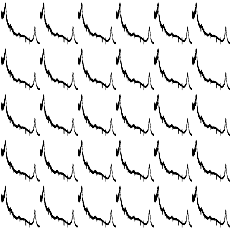

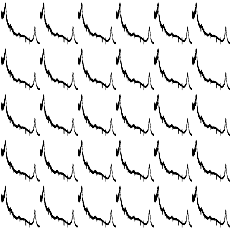

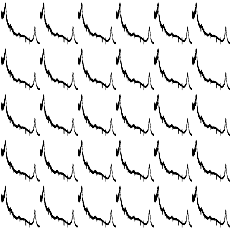

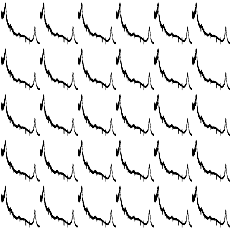

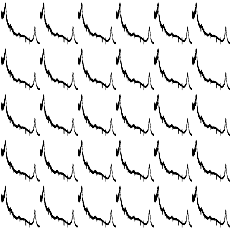

...

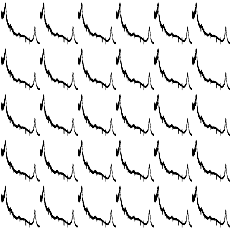

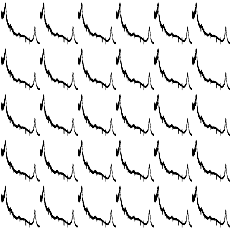

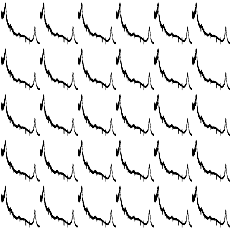

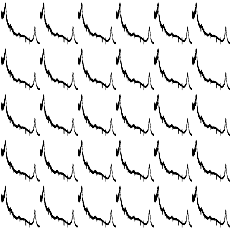

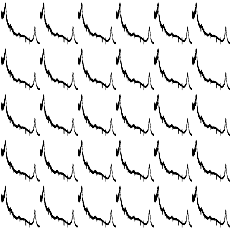

In [61]:
#make plot of good quasar spectra
good = 700

# if os.path.exists("plot_names.txt"):
#     mode = 'a'
# else:
#     mode = 'w'
    
# with open("plot_names.txt", mode) as f:

#     
for j in range(good):
    fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(23.25, 23.25), frameon=False, dpi=DPI)   #dpi good for degrading resolution of plots
    plt.setp(axs, xticks=[], yticks=[])                      #Don't want any ticks or labels

    row, col = 0, 0
    for i in range(1, N+1):
        axs[row, col].plot(wave_good, flux_good, color="k")
        adjust_spines(axs[row, col], [])

        #increment col every time we plot
        col += 1

        #if col number is 6 it means we are on first col of next row
        if i%6 == 0:
            row += 1
            col = 0

    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0) #remove whitespace between subplots
    plt.savefig("spectra/stack30_same_lowres_%s.png" % str(j+1))
    #plt.savefig("test.png") 
    plt.show()
    plt.close()
        
    #f.write("spectra/stack30_same_lowres_%s.png\n" % str(j+1))

(232, 232, 3)


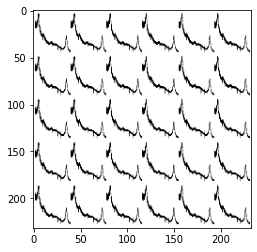

In [53]:
image= np.array(Image.open('test.png'))
        #image= np.resize(image,(608,640,1))   #want height and width to be divisible by 32 for CNN
        #image= np.resize(image,(304,320,1))
        #image= np.resize(image,(152,160,1))
img = load_img('test.png')
pixels = asarray(img)
print(pixels.shape)
plt.figure()
plt.imshow(pixels)
plt.savefig('test2.png')

In [62]:
#now insert a bad spectra

#number of images with a bad spectra
n_bad = 150

# if os.path.exists("plot_names.txt"):
#     mode = 'a'
# else:
#     mode = 'w'
    
# with open("plot_names.txt", mode) as f:
    
for k in range(1, n_bad+1):
    fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(23.25, 23.25), frameon=False, dpi=DPI)   #dpi good for degrading resolution of plots
    plt.setp(axs, xticks=[], yticks=[])                      #Don't want any ticks or labels

    row, col = 0,0
    for i in range(1, N+1):
        if i==k:
            axs[row, col].plot(wave_bad, flux_bad, color="k")
        else:
            axs[row, col].plot(wave_good, flux_good, color="k")

        adjust_spines(axs[row, col], [])

         #increment col every time we plot
        col += 1

        #if col number is 6 it means we are on first col of next row
        if i%6 == 0:
            row += 1
            col = 0

    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)   #remove whitespace between subplots
    #plt.savefig("spectra30_1diff_highres/stack30_1diff_highres_%s.png" % str(k+1))
    plt.savefig("spectra/stack30_1diff_lowres_%s.png" % str(k))
    plt.close()
    
        #f.write("spectra/stack30_1diff_lowres_%s.png\n" % str(k))


In [63]:
#now insert 2 bad spectra

n_bad = 150

# if os.path.exists("plot_names.txt"):
#     mode = 'a'
# else:
#     mode = 'w'
    
# with open("plot_names.txt", mode) as f:

for k in range(1, n_bad+1):
    fig, axs = plt.subplots(nrows=5, ncols=6, figsize=(23.25, 23.25), frameon=False, dpi=DPI)   #dpi good for degrading resolution of plots
    plt.setp(axs, xticks=[], yticks=[])                      #Don't want any ticks or labels

    inds = np.random.randint(0, N, 2)

    row, col = 0, 0
    for i in range(1, N+1):
        if i in inds:
            axs[row, col].plot(wave_bad, flux_bad, color="k")
        else:
            axs[row, col].plot(wave_good, flux_good, color="k")

        adjust_spines(axs[row, col], [])

        #increment col every time we plot
        col += 1

        #if col number is 6 it means we are on first col of next row
        if i%6 == 0:
            row += 1
            col = 0

    plt.tight_layout()
    plt.subplots_adjust(wspace=0, hspace=0)   #remove whitespace between subplots
    #plt.savefig("spectra30_2randdiff_highres/stack30_2diff_highres_%d.png" % k)
    plt.savefig("spectra/stack30_2diff_lowres_%d.png" % k)
    plt.close()
        
    #f.write("spectra/stack30_2diff_lowres_%d.png\n" % k)

In [68]:
def create_dataset(img_folder):
    from PIL import Image
    img_data_array=[]
    for file in os.listdir(img_folder):
        if '.png' in file:
            image = np.array(Image.open(img_folder+'/'+file))
            image = image.astype('float32')
            image /= 255  #normalize pixel range from 0-1
            img_data_array.append(image)
    return img_data_array 

In [69]:
PIL_img_data = create_dataset("spectra")

In [70]:
training_data = np.array(PIL_img_data)
training_data.shape

(1000, 232, 232, 4)

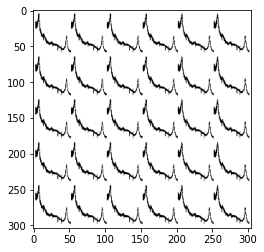

In [158]:
#training_data_new = np.resize(training_data[0], (302, 302, 4))

fig = plt.figure()
plt.imshow(training_data[0])

# plt.figure()
# plt.imshow(training_data_new)

# fig, ax = plt.subplots(frameon=False)
# img = Image.open('test.png')
# resizedImage = img.resize((320, 320))
# ax.imshow(np.array(resizedImage))
# adjust_spines(ax, [])
# plt.savefig('test2.png')

In [58]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, UpSampling2D, Dense, Flatten, Reshape, Dropout, InputLayer
import keras

def build_autoencoder(img_size):
    #img size should be tuple of (height, width) of images in data set
    print(img_size)
    encoder = Sequential([
        keras.layers.Conv2D(filters=64, kernel_size=7, activation='relu', padding='same', input_shape=[img_size[0], img_size[1],4]),
        keras.layers.MaxPooling2D(pool_size=2), 
        Dropout(0.25), 
        keras.layers.Conv2D(128, 3, activation='relu', padding='same'),  
        keras.layers.MaxPooling2D(pool_size=2),
        Dropout(0.25),
        keras.layers.Conv2D(256, 3, activation='relu', padding='same'),  
        keras.layers.MaxPooling2D(pool_size=2),
        Dropout(0.25),
    ])
    print(encoder.summary())
    
    decoder = Sequential([
        #Conv2D(256, 3, activation='relu', padding='same', input_shape=(29,29,256)),
        UpSampling2D(2, input_shape=(29,29,256)),
        Dropout(0.3),
        Conv2D(128, 3, activation='relu', padding='same'),
        UpSampling2D(2),
        Dropout(0.3),
        Conv2D(64, 3, activation='relu', padding='same'),
        UpSampling2D(2),
        Dropout(0.3), 
        Conv2D(1, 3, activation='sigmoid', padding='same'),
        Reshape([img_size[0],img_size[1],1])
    ])
    print(decoder.summary())
    return encoder, decoder





In [59]:
encoder, decoder = build_autoencoder([232,232]) #build_autoencoder([304,304]) 
autoencoder = Sequential([encoder, decoder])
autoencoder.compile(loss="mean_squared_error", optimizer="RMSprop", metrics=['accuracy'])

#autoencoder.summary()


[232, 232]
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 232, 232, 64)      12608     
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 116, 116, 64)      0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 116, 116, 64)      0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 116, 116, 128)     73856     
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 58, 58, 128)       0         
_________________________________________________________________
dropout_13 (Dropout)         (None, 58, 58, 128)       0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 58, 58,

In [ ]:
#train
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping

earlystop = EarlyStopping(
    monitor="val_loss",
    min_delta=0,
    patience=3,
    verbose=0,
    mode="auto",
    baseline=None,
    restore_best_weights=True)

epochs= 5

#split data
X_train,X_valid,ground_train,ground_valid = train_test_split(training_data, training_data,
                                                             test_size=0.2, random_state=13, 
                                                             shuffle=True)

autoencoder_train = autoencoder.fit(X_train, X_train, epochs=epochs,verbose=1,
    validation_data=(ground_train, ground_train), callbacks=earlystop)

# Model evaluation
scores = autoencoder.evaluate(X_train, X_train, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

#save weights & model
autoencoder.save_weights('autoencoder_weights.h5')
autoencoder.save("autoencoder.h5py")

accuracy = autoencoder_train.history['accuracy']
val_accuracy = autoencoder_train.history['val_accuracy']
loss = autoencoder_train.history['loss']
val_loss = autoencoder_train.history['val_loss']
epochs = range(len(accuracy))
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15,6))
ax1.plot(epochs, accuracy, 'r--', label='Training accuracy')
ax1.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
ax1.set_title('Training and validation accuracy')
ax1.legend()
ax2.plot(epochs, loss, 'r--', label='Training loss')
ax2.plot(epochs, val_loss, 'b', label='Validation loss')
ax2.set_title('Training and validation loss')
ax2.legend()
plt.show()

Epoch 1/5
25/25 [==============================] - 346s 14s/step - loss: 0.0583 - accuracy: 0.8927 - val_loss: 0.0581 - val_accuracy: 0.8927
Epoch 2/5
25/25 [==============================] - 347s 14s/step - loss: 0.0581 - accuracy: 0.8927 - val_loss: 0.0581 - val_accuracy: 0.8927
Epoch 3/5
12/25 [=============>................] - ETA: 2:17 - loss: 0.0581 - accuracy: 0.8927

In [ ]:
#visually inspect reconstructions to test accuracy
pred = autoencoder.predict(X_train)
plt.figure(figsize=(60, 12))
print("Test Images")
for i in range(3):
    plt.subplot(2, 10, i+1)
    plt.imshow(X_train[i, ..., 0], cmap='gray')
    curr_lbl = X_train[i]
    #plt.title("(Label: " + str(label_dict[curr_lbl]) + ")")
plt.show()    
plt.figure(figsize=(60, 12))
print("Reconstruction of Test Images")
for i in range(3):
    plt.subplot(2, 10, i+1)
    plt.imshow(pred[i, ..., 0], cmap='gray')  
plt.show()